<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 5px; height: 50px"> 

#   Personalizing Music Video Recommendations with Emotional Intelligence

> Capstone Project: Lionel Foo

---

## <b> Notebook: 01 EDA & Data Cleaning </b>

---

## 01 Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud
import contractions
import re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

pd.options.display.max_colwidth = 500

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/lionel/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



---

## 02 Load & Check Data

### 02.01 Load & Check Data

In [2]:
# Load data:
df = pd.read_csv('Data/emotions.csv')
# Check top 5 rows of dataset:
df.head()

,Unnamed: 0,text,label
0,0,i just feel really helpless and heavy hearted,4
1,1,ive enjoyed being able to slouch about relax and unwind and frankly needed it after those last few weeks around the end of uni and the expo i have lately started to find myself feeling a bit listless which is never really a good thing,0
2,2,i gave up my internship with the dmrg and am feeling distraught,4
3,3,i dont know i feel so lost,0
4,4,i am a kindergarten teacher and i am thoroughly weary of my job after having taken the university entrance exam i suffered from anxiety for weeks as i did not want to carry on with my work studies were the only alternative,4


In [3]:
# Drop unecessary columns:
df.drop(columns='Unnamed: 0', inplace=True)

### 02.02 Check Data Information & for Null Values

In [4]:
# Check data info:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416809 entries, 0 to 416808
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   text    416809 non-null  object
 1   label   416809 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 6.4+ MB


In [5]:
# Check data for null values:
df.isnull().sum()

text     0
label    0
dtype: int64

### 02.02 Observations & Findings

<details><summary> Show details: </summary>

> **Data Type**
> - All columns have the correct data type.
>
> **Null Values** (`text`)
> - 0 null tweets observed.
>
> **Analysis** (`text`)
> - Noted that there were contractions with **'t whereby ' has been replace with space**
> - **url weblink related words** observed.
> - rows with only **one word** observed.
> - rows with **duplicate comments** observed.
>
> **Follow-Up Actions**
> - **Convert** words to lowercase
> - **Replace** ' t' with 't' 
> - **Convert** contraction words
> - **Remove** weblink related words
> - Others:
>   - **Remove** unecessary whitespaces
>   - **Drop** rows with only one word
>   - **Drop** rows with duplicate comments

</details>

### 02.03 Clean Data

In [6]:
# Convert strings in column 'tweet' to lowercase:
df['text'] = df['text'].str.lower()

In [7]:
# Replace ' t' with 't' in the 'text' column
df['text'] = df['text'].str.replace(pat=' t ', repl='t ', regex=True)

In [8]:
# Convert contraction words in column 'textt':
# Define contraction function:
def expand_contractions(text):
    return contractions.fix(text)

# Apply contraction function:
df['text'] = df['text'].apply(expand_contractions)

In [9]:
# remove weblink related words:
# List of words to remove from the 'text' column
words_to_remove = ['img', 'src', 'http', 'href', 'www', 'https']

# Iterate over each word in the list
for word in words_to_remove:
    # Replace each word in the 'text' column with an empty string
    # The '\\b' ensures that only whole words are matched
    df['text'] = df['text'].str.replace(pat=f'\\b{word}\\b', repl='', regex=True)


In [10]:
# Removing any excess white spaces
# Replace empty whitespaces in column 'text' with ' ':
df['text'] = df['text'].str.replace(pat='\s+', repl=' ', regex=True)

# Remove trailing whitespaces in column 'text':
df['text'] = df['text'].str.strip()

# Remove unecessary whitespaces:
df['text'] = df['text'].str.split(' ').str.join(' ')

In [11]:
# Drop rows where 'text' column has only 1 word
df = df[df['text'].apply(lambda x: len(x.split(' ')) > 1)]

In [12]:
# Drop duplicate rows based on the 'text' column
df = df.drop_duplicates(subset='text')

# Reset the index of the DataFrame
df = df.reset_index(drop=True)

## 03 EDA

### 03.01 EDA for distribution of emotions

In [13]:
# # Display the count of unique values in the 'label' column of the DataFrame 'df'.
df['label'].value_counts()

label
1    134709
0    118152
3     54597
4     43497
2     29410
5     12381
Name: count, dtype: int64

In [14]:
# Map numerical labels to emotion names
emotions_mapping = {0: 'Sadness', 1: 'Joy', 2: 'Love', 3: 'Anger', 4: 'Fear', 5: 'Surprise'}
df['emotion_name'] = df['label'].map(emotions_mapping)

In [15]:
# Display the count of unique values in the 'emotion' column of the DataFrame 'df'.
df['emotion_name'].value_counts()

emotion_name
Joy         134709
Sadness     118152
Anger        54597
Fear         43497
Love         29410
Surprise     12381
Name: count, dtype: int64

In [16]:
# Plot pie chart for distribution of emotions
emotions_distribution = df['emotion_name'].value_counts().reset_index()
emotions_distribution.columns = ['Emotion', 'Count']

fig = px.pie(emotions_distribution, names='Emotion', values='Count', title='Distribution of Emotions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [20]:
# Define a color list for each emotion
color_list = ['grey', 'blue', 'red', 'yellow', 'green', 'orange']

# Plot histogram for the distribution of emotions
fig = px.histogram(df, x='emotion_name', color='emotion_name', title='Histogram for Emotions',
                   labels={'emotion_name': 'Emotions', 'count': 'Number of Tweets'},
                   color_discrete_sequence=color_list)
fig.update_layout(bargap=0.1)
fig.show()

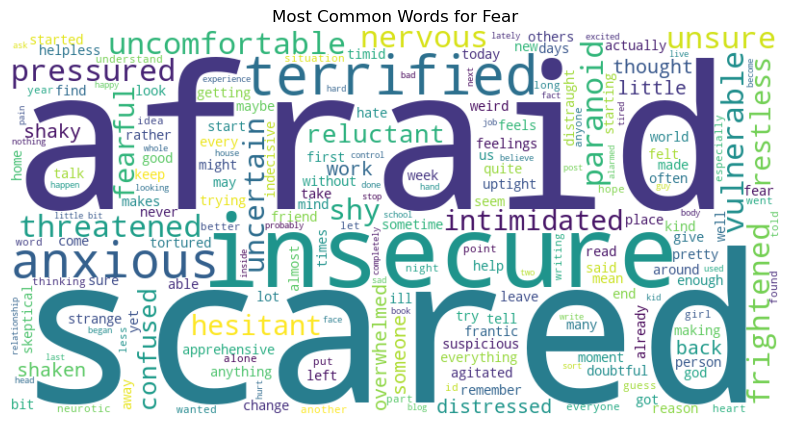

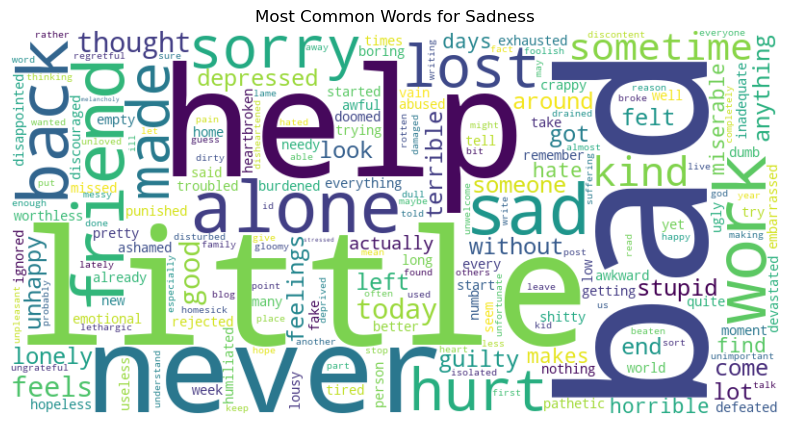

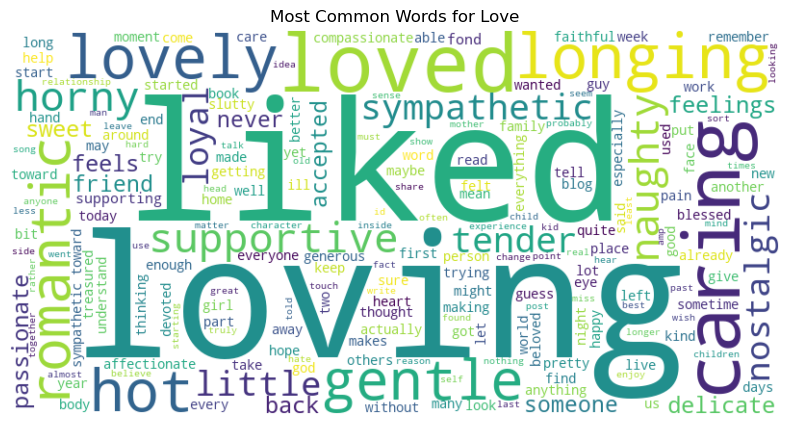

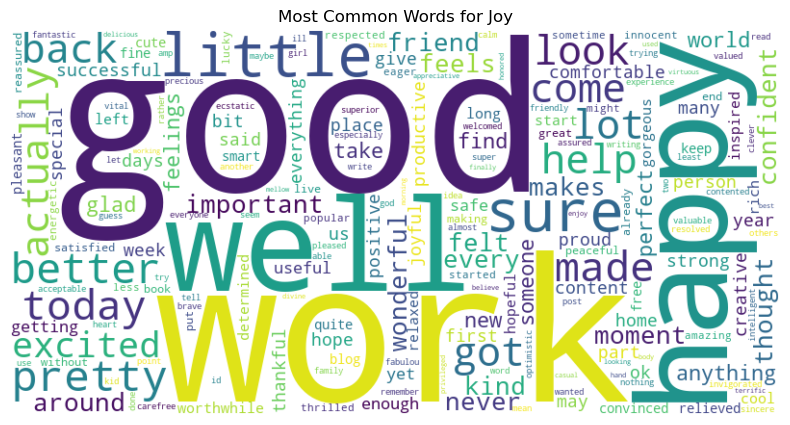

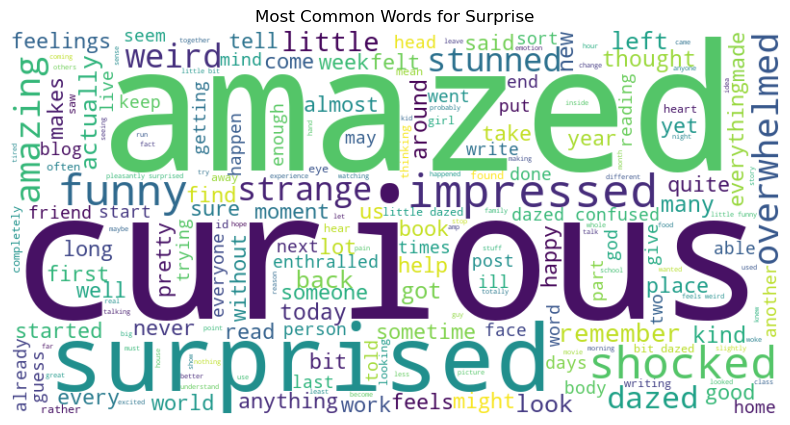

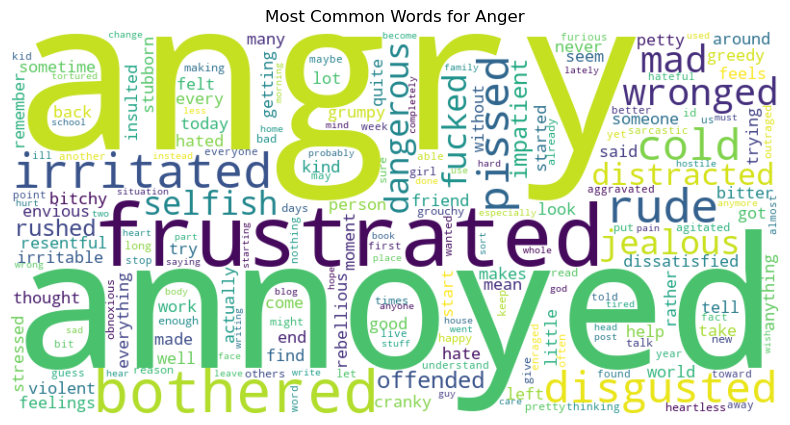

In [24]:
# Get the set of English stopwords
stop_words = set(stopwords.words('english'))

# Add your custom stopwords
custom_stopwords = ['feel', 'feeling', 'think', 'thing', 'know', 'time', 'really', 'one', 'make', 'people', 'way', 'want',
                    'even', 'still', 'day', 'much', 'love', 'going', 'life', 'things', 'going', 'go', 'something', 'say',
                    'need', 'right', 'always', 'though', 'see']
stop_words.update(custom_stopwords)

# Generate and display a word cloud for each unique emotion present in the DataFrame 'df', with more frequent words appearing larger
# For each emotion, first extracts the associated text, split it into individual words, and filters out the stopwords
emotions = df['emotion_name'].unique()
for emotion in emotions:
    # Split the text into words
    words = df[df['emotion_name'] == emotion]['text'].str.split()
    # Filter out the stopwords, then join back into a string
    words = ' '.join(word for word_list in words for word in word_list if word not in stop_words)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(words)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Most Common Words for {emotion}')
    plt.show()

### 03.01 Observations & Findings for distribution
*‘Surprise’ emotion is significantly less common in the dataset than the other emotions*
- To balance dataset by removing all rows with 'Surprise' class from the dataset
- *Surprise is a transient emotion*: Based on literature Surprise is often considered a brief mental and physiological state. It’s a startle response that quickly merges into another emotion depending on what caused the surprise. This transient nature might make it less relevant for my music video recommendation system, which presumably aims to match longer-lasting emotional states.
- *Surprise can have any valence*: Surprise can be neutral, pleasant, unpleasant, positive, or negative. This wide range of valences might make it difficult to match with a specific type of music video and also result in significant overlap between the texts of surprise and other emotions further confounding my model

In [31]:
# Drop rows where 'label' column is 5 (corresponds to 'Surprise')
df = df[df['label'] != 5]

# Reset the index of the DataFrame
df = df.reset_index(drop=True)

In [32]:
# check
df['emotion_name'].value_counts()

emotion_name
Joy        134709
Sadness    118152
Anger       54597
Fear        43497
Love        29410
Name: count, dtype: int64

In [33]:
# Check data info:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 380365 entries, 0 to 380364
Data columns (total 3 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   text          380365 non-null  object
 1   label         380365 non-null  int64 
 2   emotion_name  380365 non-null  object
dtypes: int64(1), object(2)
memory usage: 8.7+ MB


### 03.02 EDA for word count

In [34]:
# Count words in 'text' column and create 'status_word_count' in df
df['status_word_count'] = df['text'].apply(lambda x: len(re.findall(r'\b\w+\b', str(x))))
df.head()

,text,label,emotion_name,status_word_count
0,i just feel really helpless and heavy hearted,4,Fear,8
1,i have enjoyed being able to slouch about relax and unwind and frankly needed it after those last few weeks around the end of uni and the expo i have lately started to find myself feeling a bit listless which is never really a good thing,0,Sadness,46
2,i gave up my internship with the dmrg and am feeling distraught,4,Fear,12
3,i do not know i feel so lost,0,Sadness,8
4,i am a kindergarten teacher and i am thoroughly weary of my job after having taken the university entrance exam i suffered from anxiety for weeks as i did not want to carry on with my work studies were the only alternative,4,Fear,42


/Users/lionel/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/lionel/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/lionel/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/lionel/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/lionel/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_a

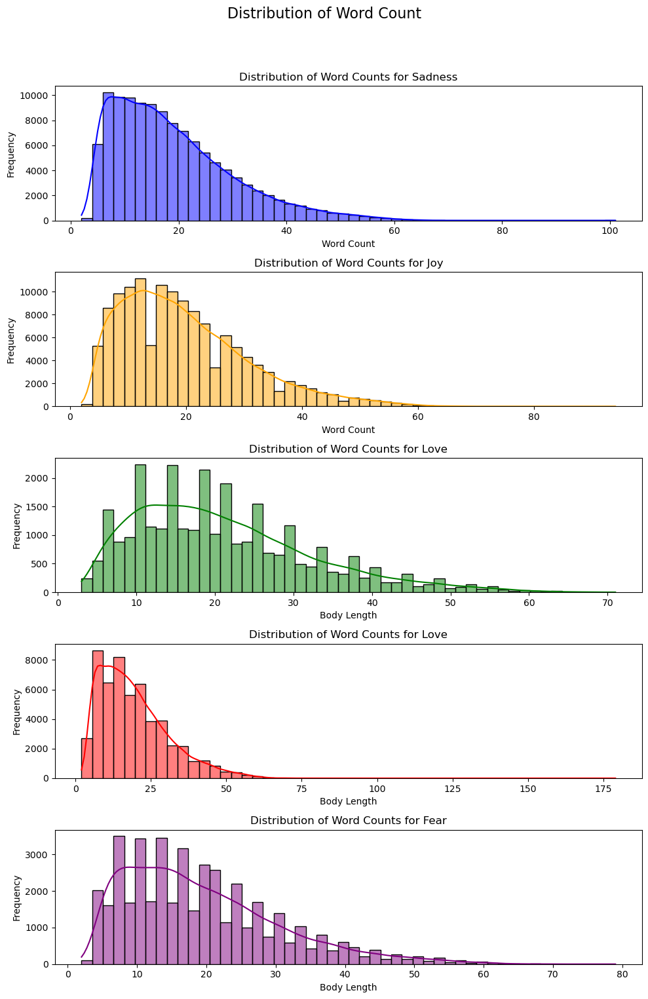

In [35]:
# Set up the figure and axes
fig, axes = plt.subplots(5, 1, figsize=(10, 16))
fig.suptitle("Distribution of Word Count", fontsize=16)

# Distribution of word counts for Sadness (label = 0)
sns.histplot(df[df['label'] == 0]['status_word_count'], bins=50, kde=True, ax=axes[0], color='blue')
axes[0].set_title("Distribution of Word Counts for Sadness")
axes[0].set_xlabel("Word Count")
axes[0].set_ylabel("Frequency")

# Distribution of word counts for Joy (label = 1)
sns.histplot(df[df['label'] == 1]['status_word_count'], bins=50, kde=True, ax=axes[1], color='orange')
axes[1].set_title("Distribution of Word Counts for Joy")
axes[1].set_xlabel("Word Count")
axes[1].set_ylabel("Frequency")

# Distribution of word counts for Love (label = 2)
sns.histplot(df[df['label'] == 2]['status_word_count'], bins=50, kde=True, ax=axes[2], color='green')
axes[2].set_title("Distribution of Word Counts for Love")
axes[2].set_xlabel("Body Length")
axes[2].set_ylabel("Frequency")

# Distribution of word counts for Anger (label = 3)
sns.histplot(df[df['label'] == 3]['status_word_count'], bins=50, kde=True, ax=axes[3], color='red')
axes[3].set_title("Distribution of Word Counts for Love")
axes[3].set_xlabel("Body Length")
axes[3].set_ylabel("Frequency")

# Distribution of word counts for Fear (label = 4)
sns.histplot(df[df['label'] == 4]['status_word_count'], bins=50, kde=True, ax=axes[4], color='purple')
axes[4].set_title("Distribution of Word Counts for Fear")
axes[4].set_xlabel("Body Length")
axes[4].set_ylabel("Frequency")

# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

In [40]:
percentiles = df.groupby('emotion_name')['status_word_count'].quantile(0.98)
print(percentiles)

emotion_name
Anger      49.0
Fear       49.0
Joy        49.0
Love       50.0
Sadness    48.0
Name: status_word_count, dtype: float64


### 03.02 Observations & Findings for word count
To determine an appropriate maximum word count for the text classifier's tokenizer, I analyzed the distribution of word counts in the dataset. Considering the 98th percentiles, a maximum word count of 50 appears to be a reasonable choice. This value ensures that the tokenizer captures the vast majority of words in each emotion category, minimizing data loss while effectively representing the textual information. Therefore, I propose setting the maximum word count to 50 for the tokenizer, striking a balance between including relevant information and managing computational resources efficiently.



---

## 04 Export Data

In [23]:
# Create output folder and export data frame 'comments' as 'comments.csv':
df.to_csv('data/emotions_processed_dataset.csv', index=False)